# Intro Task, Object Localization 

In [1]:
# install libraries/packages/modules 

!pip install -U git+https://github.com/albumentations-team/albumentations
!pip install timm
!pip install --upgrade opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/albumentations-team/albumentations to /tmp/pip-req-build-0n73c6a6
  Running command git clone -q https://github.com/albumentations-team/albumentations /tmp/pip-req-build-0n73c6a6
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Download Dataset

!git clone https://github.com/parth1620/object-localization-dataset.git

fatal: destination path 'object-localization-dataset' already exists and is not an empty directory.


In [3]:
import pandas as pd 
import numpy as np 
import cv2, timm
import matplotlib.pyplot as plt
import torch
from tqdm.notebook import tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [4]:
import sys
sys.path.append('/content/object-localization-dataset')

# Configurations

In [5]:
csv_file = "/content/object-localization-dataset/train.csv"
data_dir = "/content/object-localization-dataset/"
device = "cuda"
img_size = 140
bs = 16
lr = 1e-3
epochs = 500
model_name = "efficientnet_b3"
num_cor = 4

In [6]:
df = pd.read_csv(csv_file)
df.head()

,img_path,xmin,ymin,xmax,ymax,width,height,label
0,train_images/mushroom_51.jpg,24,23,202,183,227,227,mushroom
1,train_images/eggplant_37.jpg,34,34,88,201,227,227,eggplant
2,train_images/mushroom_20.jpg,49,86,183,185,227,227,mushroom
3,train_images/eggplant_51.jpg,51,59,191,164,227,227,eggplant
4,train_images/eggplant_26.jpg,40,70,179,168,227,227,eggplant


# Understand the dataset

(-0.5, 226.5, 226.5, -0.5)

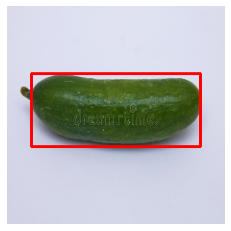

In [7]:
example_num = 20
example = df.iloc[example_num]
im = cv2.imread(data_dir + example.img_path)
im = cv2.cvtColor(cv2.imread(data_dir + example.img_path), cv2.COLOR_BGR2RGB)
pt1 = (example.xmin, example.ymin)
pt2 = (example.xmax, example.ymax)
bounding_box = cv2.rectangle(im, pt1, pt2, (255, 0, 0), 2)
plt.imshow(bounding_box)
plt.axis('off')

In [8]:
train_df, valid_df = train_test_split(df, test_size=0.2, random_state=42)
print(f"Number of training samples: {len(train_df)}")
print(f"Number of validation samples: {len(valid_df)}")

Number of training samples: 148
Number of validation samples: 38


# Augmentations

In [9]:
import albumentations as A

In [10]:
train_augmentations = A.Compose([
    A.Resize(img_size, img_size),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields = ['class_labels']))

valid_augmentations = A.Compose([
    A.Resize(img_size, img_size),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields = ['class_labels']))

# Create Custom Dataset

In [11]:
class ObjectLocalizationDataset(torch.utils.data.Dataset):

  def __init__(self, df, augmentations=None):

    self.df = df
    self.augs = augmentations

  def __len__(self):
    return len(self.df)

  def __getitem__(self, idx):

    example = self.df.iloc[idx]

    xmin = example.xmin
    xmax = example.xmax
    ymin = example.ymin
    ymax = example.ymax

    bbox = [[xmin, ymin, xmax, ymax]]

    im_path = data_dir + example.img_path
    im = cv2.cvtColor(cv2.imread(im_path), cv2.COLOR_BGR2RGB)

    if self.augs:
      data = self.augs(image=im, bboxes=bbox, class_labels=[None])
      im = data['image']
      bbox = data['bboxes'][0]

    im = torch.from_numpy(im).permute(2, 0, 1) / 255.
    bbox = torch.Tensor(bbox)

    return im, bbox

In [12]:
trainset = ObjectLocalizationDataset(train_df, augmentations=train_augmentations)
validset = ObjectLocalizationDataset(valid_df, augmentations=valid_augmentations)
print(f"Number of training samples: {len(trainset)}")
print(f"Number of validation samples: {len(validset)}")

Number of training samples: 148
Number of validation samples: 38


(-0.5, 139.5, 139.5, -0.5)

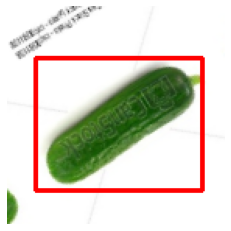

In [13]:
example_num = 20
img, bbox = trainset[example_num]

xmin, ymin, xmax, ymax = bbox

pt1 = (int(xmin), int(ymin))
pt2 = (int(xmax), int(ymax))

bnd_img = cv2.rectangle(img.permute(1, 2, 0).numpy(),pt1, pt2,(255,0,0),2)
plt.imshow(bnd_img)
plt.axis('off')

# Load dataset into batches

In [14]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=bs, shuffle=True)
validloader = torch.utils.data.DataLoader(validset, batch_size=bs, shuffle=False)

In [15]:
print("Total no. batches in trainloader : {}".format(len(trainloader)))
print("Total no. batches in validloader : {}".format(len(validloader)))

Total no. batches in trainloader : 10
Total no. batches in validloader : 3


In [16]:
for im, bbox in trainloader:
  break;

print("Shape of one batch images : {}".format(im.shape))
print("Shape of one batch bboxes : {}".format(bbox.shape))

Shape of one batch images : torch.Size([16, 3, 140, 140])
Shape of one batch bboxes : torch.Size([16, 4])


# Create Loss Function and Model

In [17]:
from torch import nn
class CustomLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(CustomLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        total_loss = 0 
        for i in range(len(inputs)):
          # print(f"inputs: {inputs[i]}")
          # print(f"targets: {targets[i]}")
          xmin_in, ymin_in, xmax_in, y_max_in = inputs[i] 
          xmin_gt, ymin_gt, xmax_gt, y_max_gt = targets[i]
          
          loss = (xmin_gt - xmin_in) + (ymin_gt - ymin_in) + (xmax_gt - xmax_in) + (y_max_gt - y_max_in)
          total_loss += loss

        return total_loss / len(inputs)

class Model(torch.nn.Module):

  def __init__(self, ):
    super(Model, self).__init__()

    self.backbone = timm.create_model(model_name, pretrained=True, num_classes=4)

  def forward(self, ims, bboxes=None):

    bbs = self.backbone(ims)
    # print(bbs.shape)
    # print(bboxes.shape)
    # print(bbs)
    # print(bboxes)


    if bboxes != None:
      loss = torch.nn.MSELoss()(bbs, bboxes)
      return bbs, loss

model = Model()
model.to(device);

# Create Train and Eval Function

In [18]:
def train_fn(model, dl, opt):

  total_loss = 0.
  model.train()

  for batch in tqdm(dl):
    ims, gts = batch
    ims, gts = ims.to(device), gts.to(device)

    bboxes, loss = model(ims, gts)

    opt.zero_grad()
    loss.backward()
    opt.step()

    total_loss += loss.item()

  return total_loss / len(dl)

In [19]:
def eval_fn(model, dl):

  total_loss = 0.
  model.eval()

  with torch.no_grad():
    for batch in tqdm(dl):
      ims, gts = batch
      ims, gts = ims.to(device), gts.to(device)

      bboxes, loss = model(ims, gts)

      total_loss += loss.item()

  return total_loss / len(dl)

#Training Loop

In [20]:
opt = torch.optim.Adam(model.parameters(), lr=lr)
best_valid_loss = np.Inf

for epoch in range(epochs):

  train_loss = train_fn(model, trainloader, opt)
  valid_loss = eval_fn(model, validloader)

  if valid_loss < best_valid_loss:
    torch.save(model.state_dict(), "best_model.pt")
    print("Best weights are saved!")
    best_valid_loss = valid_loss

  print(f"Epoch {epoch + 1} train loss: {train_loss:.3f}")
  print(f"Epoch {epoch + 1} valid loss: {valid_loss:.3f}")

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 1 train loss: 4980.902
Epoch 1 valid loss: 4810.708


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 2 train loss: 923.998
Epoch 2 valid loss: 6415.434


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 3 train loss: 399.280
Epoch 3 valid loss: 1071.237


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 4 train loss: 289.173
Epoch 4 valid loss: 259.577


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 5 train loss: 220.523
Epoch 5 valid loss: 156.845


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 6 train loss: 159.348
Epoch 6 valid loss: 175.055


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 7 train loss: 117.568
Epoch 7 valid loss: 163.521


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 8 train loss: 105.666
Epoch 8 valid loss: 162.585


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 9 train loss: 97.116
Epoch 9 valid loss: 109.263


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 10 train loss: 91.057
Epoch 10 valid loss: 123.976


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 11 train loss: 89.598
Epoch 11 valid loss: 108.789


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 12 train loss: 84.885
Epoch 12 valid loss: 135.518


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 13 train loss: 100.088
Epoch 13 valid loss: 157.894


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 14 train loss: 85.139
Epoch 14 valid loss: 122.640


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 15 train loss: 80.384
Epoch 15 valid loss: 120.632


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 16 train loss: 77.840
Epoch 16 valid loss: 94.774


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 17 train loss: 66.756
Epoch 17 valid loss: 77.828


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 18 train loss: 61.792
Epoch 18 valid loss: 69.175


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 19 train loss: 54.722
Epoch 19 valid loss: 95.741


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 20 train loss: 45.691
Epoch 20 valid loss: 84.906


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 21 train loss: 53.354
Epoch 21 valid loss: 88.551


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 22 train loss: 59.777
Epoch 22 valid loss: 68.645


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 23 train loss: 51.205
Epoch 23 valid loss: 54.864


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 24 train loss: 56.908
Epoch 24 valid loss: 97.952


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 25 train loss: 59.483
Epoch 25 valid loss: 84.926


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 26 train loss: 48.903
Epoch 26 valid loss: 59.101


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 27 train loss: 46.298
Epoch 27 valid loss: 71.625


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 28 train loss: 43.709
Epoch 28 valid loss: 56.440


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 29 train loss: 43.998
Epoch 29 valid loss: 55.340


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 30 train loss: 49.758
Epoch 30 valid loss: 69.835


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 31 train loss: 47.874
Epoch 31 valid loss: 71.026


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 32 train loss: 51.337
Epoch 32 valid loss: 59.537


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 33 train loss: 48.058
Epoch 33 valid loss: 99.384


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 34 train loss: 55.787
Epoch 34 valid loss: 117.848


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 35 train loss: 55.801
Epoch 35 valid loss: 102.938


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 36 train loss: 46.836
Epoch 36 valid loss: 63.428


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 37 train loss: 39.634
Epoch 37 valid loss: 78.797


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 38 train loss: 43.312
Epoch 38 valid loss: 101.195


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 39 train loss: 51.120
Epoch 39 valid loss: 67.028


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 40 train loss: 30.931
Epoch 40 valid loss: 55.407


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 41 train loss: 39.144
Epoch 41 valid loss: 66.035


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 42 train loss: 35.737
Epoch 42 valid loss: 58.452


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 43 train loss: 37.515
Epoch 43 valid loss: 67.657


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 44 train loss: 38.243
Epoch 44 valid loss: 47.466


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 45 train loss: 31.195
Epoch 45 valid loss: 50.887


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 46 train loss: 41.550
Epoch 46 valid loss: 70.176


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 47 train loss: 27.332
Epoch 47 valid loss: 58.342


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 48 train loss: 32.794
Epoch 48 valid loss: 66.911


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 49 train loss: 49.461
Epoch 49 valid loss: 57.769


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 50 train loss: 41.543
Epoch 50 valid loss: 55.874


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 51 train loss: 41.941
Epoch 51 valid loss: 51.674


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 52 train loss: 28.633
Epoch 52 valid loss: 46.420


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 53 train loss: 24.979
Epoch 53 valid loss: 50.109


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 54 train loss: 28.792
Epoch 54 valid loss: 70.931


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 55 train loss: 26.968
Epoch 55 valid loss: 46.881


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 56 train loss: 28.304
Epoch 56 valid loss: 47.950


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 57 train loss: 37.418
Epoch 57 valid loss: 49.585


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 58 train loss: 50.400
Epoch 58 valid loss: 54.093


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 59 train loss: 36.226
Epoch 59 valid loss: 54.343


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 60 train loss: 28.828
Epoch 60 valid loss: 52.882


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 61 train loss: 35.971
Epoch 61 valid loss: 55.696


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 62 train loss: 26.597
Epoch 62 valid loss: 50.467


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 63 train loss: 33.879
Epoch 63 valid loss: 57.723


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 64 train loss: 25.726
Epoch 64 valid loss: 58.786


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 65 train loss: 45.235
Epoch 65 valid loss: 61.002


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 66 train loss: 30.745
Epoch 66 valid loss: 63.740


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 67 train loss: 28.304
Epoch 67 valid loss: 49.473


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 68 train loss: 28.292
Epoch 68 valid loss: 48.168


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 69 train loss: 29.044
Epoch 69 valid loss: 68.040


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 70 train loss: 30.096
Epoch 70 valid loss: 47.050


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 71 train loss: 37.615
Epoch 71 valid loss: 53.392


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 72 train loss: 25.981
Epoch 72 valid loss: 65.468


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 73 train loss: 34.428
Epoch 73 valid loss: 54.781


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 74 train loss: 56.250
Epoch 74 valid loss: 67.774


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 75 train loss: 42.642
Epoch 75 valid loss: 64.293


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 76 train loss: 28.995
Epoch 76 valid loss: 56.794


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 77 train loss: 24.746
Epoch 77 valid loss: 68.144


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 78 train loss: 28.684
Epoch 78 valid loss: 45.555


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 79 train loss: 30.037
Epoch 79 valid loss: 53.808


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 80 train loss: 21.363
Epoch 80 valid loss: 53.336


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 81 train loss: 20.741
Epoch 81 valid loss: 45.902


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 82 train loss: 25.713
Epoch 82 valid loss: 46.476


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 83 train loss: 30.943
Epoch 83 valid loss: 51.971


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 84 train loss: 25.619
Epoch 84 valid loss: 51.387


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 85 train loss: 24.846
Epoch 85 valid loss: 56.118


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 86 train loss: 23.159
Epoch 86 valid loss: 58.160


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 87 train loss: 24.402
Epoch 87 valid loss: 51.582


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 88 train loss: 23.653
Epoch 88 valid loss: 54.254


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 89 train loss: 32.191
Epoch 89 valid loss: 66.315


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 90 train loss: 29.065
Epoch 90 valid loss: 47.795


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 91 train loss: 26.724
Epoch 91 valid loss: 69.434


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 92 train loss: 46.533
Epoch 92 valid loss: 58.990


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 93 train loss: 34.023
Epoch 93 valid loss: 74.087


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 94 train loss: 30.342
Epoch 94 valid loss: 61.534


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 95 train loss: 33.099
Epoch 95 valid loss: 61.147


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 96 train loss: 26.257
Epoch 96 valid loss: 98.121


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 97 train loss: 29.804
Epoch 97 valid loss: 59.670


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 98 train loss: 29.667
Epoch 98 valid loss: 73.600


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 99 train loss: 25.281
Epoch 99 valid loss: 62.803


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 100 train loss: 23.204
Epoch 100 valid loss: 57.477


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 101 train loss: 26.099
Epoch 101 valid loss: 56.135


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 102 train loss: 24.103
Epoch 102 valid loss: 63.382


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 103 train loss: 23.514
Epoch 103 valid loss: 56.692


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 104 train loss: 32.200
Epoch 104 valid loss: 58.676


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 105 train loss: 37.366
Epoch 105 valid loss: 73.701


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 106 train loss: 44.038
Epoch 106 valid loss: 69.887


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 107 train loss: 34.950
Epoch 107 valid loss: 72.883


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 108 train loss: 26.326
Epoch 108 valid loss: 55.535


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 109 train loss: 29.575
Epoch 109 valid loss: 52.286


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 110 train loss: 26.493
Epoch 110 valid loss: 42.878


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 111 train loss: 32.010
Epoch 111 valid loss: 67.875


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 112 train loss: 26.325
Epoch 112 valid loss: 74.076


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 113 train loss: 22.062
Epoch 113 valid loss: 63.268


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 114 train loss: 26.036
Epoch 114 valid loss: 60.369


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 115 train loss: 21.430
Epoch 115 valid loss: 66.207


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 116 train loss: 28.431
Epoch 116 valid loss: 64.374


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 117 train loss: 29.959
Epoch 117 valid loss: 74.558


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 118 train loss: 21.529
Epoch 118 valid loss: 54.640


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 119 train loss: 21.756
Epoch 119 valid loss: 51.382


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 120 train loss: 27.800
Epoch 120 valid loss: 59.444


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 121 train loss: 21.106
Epoch 121 valid loss: 65.423


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 122 train loss: 16.871
Epoch 122 valid loss: 75.141


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 123 train loss: 23.295
Epoch 123 valid loss: 58.489


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 124 train loss: 41.348
Epoch 124 valid loss: 80.673


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 125 train loss: 23.135
Epoch 125 valid loss: 75.031


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 126 train loss: 22.895
Epoch 126 valid loss: 71.203


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 127 train loss: 16.795
Epoch 127 valid loss: 59.956


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 128 train loss: 24.357
Epoch 128 valid loss: 55.876


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 129 train loss: 24.201
Epoch 129 valid loss: 49.872


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 130 train loss: 18.034
Epoch 130 valid loss: 56.946


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 131 train loss: 26.412
Epoch 131 valid loss: 72.573


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 132 train loss: 20.238
Epoch 132 valid loss: 49.923


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 133 train loss: 29.716
Epoch 133 valid loss: 50.490


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 134 train loss: 21.701
Epoch 134 valid loss: 53.322


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 135 train loss: 22.156
Epoch 135 valid loss: 41.307


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 136 train loss: 20.440
Epoch 136 valid loss: 49.512


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 137 train loss: 20.423
Epoch 137 valid loss: 55.873


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 138 train loss: 18.279
Epoch 138 valid loss: 72.842


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 139 train loss: 29.358
Epoch 139 valid loss: 47.311


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 140 train loss: 24.491
Epoch 140 valid loss: 39.484


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 141 train loss: 21.699
Epoch 141 valid loss: 47.641


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 142 train loss: 19.694
Epoch 142 valid loss: 62.653


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 143 train loss: 21.955
Epoch 143 valid loss: 51.038


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 144 train loss: 19.467
Epoch 144 valid loss: 54.658


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 145 train loss: 22.008
Epoch 145 valid loss: 54.053


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 146 train loss: 34.951
Epoch 146 valid loss: 77.230


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 147 train loss: 24.852
Epoch 147 valid loss: 39.558


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 148 train loss: 25.583
Epoch 148 valid loss: 49.390


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 149 train loss: 20.306
Epoch 149 valid loss: 68.747


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 150 train loss: 26.183
Epoch 150 valid loss: 50.476


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 151 train loss: 20.058
Epoch 151 valid loss: 51.090


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 152 train loss: 13.672
Epoch 152 valid loss: 44.662


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 153 train loss: 29.761
Epoch 153 valid loss: 54.883


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 154 train loss: 21.903
Epoch 154 valid loss: 59.293


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 155 train loss: 25.704
Epoch 155 valid loss: 48.574


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 156 train loss: 24.018
Epoch 156 valid loss: 56.305


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 157 train loss: 28.460
Epoch 157 valid loss: 57.124


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 158 train loss: 21.888
Epoch 158 valid loss: 75.841


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 159 train loss: 23.211
Epoch 159 valid loss: 71.605


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 160 train loss: 27.116
Epoch 160 valid loss: 64.558


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 161 train loss: 17.389
Epoch 161 valid loss: 49.012


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 162 train loss: 22.752
Epoch 162 valid loss: 73.080


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 163 train loss: 30.190
Epoch 163 valid loss: 54.739


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 164 train loss: 17.299
Epoch 164 valid loss: 41.618


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 165 train loss: 11.368
Epoch 165 valid loss: 61.327


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 166 train loss: 17.757
Epoch 166 valid loss: 56.190


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 167 train loss: 18.711
Epoch 167 valid loss: 117.048


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 168 train loss: 18.994
Epoch 168 valid loss: 43.014


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 169 train loss: 16.731
Epoch 169 valid loss: 78.143


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 170 train loss: 21.651
Epoch 170 valid loss: 35.048


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 171 train loss: 18.786
Epoch 171 valid loss: 38.228


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 172 train loss: 15.678
Epoch 172 valid loss: 50.274


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 173 train loss: 15.516
Epoch 173 valid loss: 56.792


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 174 train loss: 13.009
Epoch 174 valid loss: 49.051


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 175 train loss: 13.941
Epoch 175 valid loss: 53.355


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 176 train loss: 14.442
Epoch 176 valid loss: 47.554


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 177 train loss: 17.674
Epoch 177 valid loss: 65.787


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 178 train loss: 19.076
Epoch 178 valid loss: 49.443


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 179 train loss: 17.865
Epoch 179 valid loss: 49.705


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 180 train loss: 18.738
Epoch 180 valid loss: 50.015


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 181 train loss: 15.660
Epoch 181 valid loss: 75.780


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 182 train loss: 18.694
Epoch 182 valid loss: 69.273


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 183 train loss: 22.280
Epoch 183 valid loss: 59.365


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 184 train loss: 16.150
Epoch 184 valid loss: 51.595


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 185 train loss: 17.944
Epoch 185 valid loss: 47.187


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 186 train loss: 16.109
Epoch 186 valid loss: 57.588


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 187 train loss: 15.962
Epoch 187 valid loss: 44.340


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 188 train loss: 13.677
Epoch 188 valid loss: 52.853


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 189 train loss: 10.924
Epoch 189 valid loss: 37.559


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 190 train loss: 13.066
Epoch 190 valid loss: 53.066


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 191 train loss: 19.081
Epoch 191 valid loss: 54.400


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 192 train loss: 13.642
Epoch 192 valid loss: 76.872


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 193 train loss: 13.942
Epoch 193 valid loss: 59.390


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 194 train loss: 13.100
Epoch 194 valid loss: 41.365


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 195 train loss: 15.738
Epoch 195 valid loss: 48.992


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 196 train loss: 16.792
Epoch 196 valid loss: 43.240


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 197 train loss: 11.947
Epoch 197 valid loss: 68.164


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 198 train loss: 36.375
Epoch 198 valid loss: 75.140


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 199 train loss: 22.990
Epoch 199 valid loss: 112.273


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 200 train loss: 24.712
Epoch 200 valid loss: 56.431


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 201 train loss: 18.669
Epoch 201 valid loss: 69.958


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 202 train loss: 17.063
Epoch 202 valid loss: 58.100


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 203 train loss: 19.051
Epoch 203 valid loss: 59.214


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 204 train loss: 16.512
Epoch 204 valid loss: 52.135


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 205 train loss: 13.555
Epoch 205 valid loss: 34.070


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 206 train loss: 13.951
Epoch 206 valid loss: 43.768


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 207 train loss: 13.377
Epoch 207 valid loss: 62.229


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 208 train loss: 11.645
Epoch 208 valid loss: 47.875


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 209 train loss: 11.909
Epoch 209 valid loss: 57.318


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 210 train loss: 12.241
Epoch 210 valid loss: 71.181


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 211 train loss: 15.955
Epoch 211 valid loss: 72.125


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 212 train loss: 16.680
Epoch 212 valid loss: 59.234


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 213 train loss: 16.690
Epoch 213 valid loss: 74.226


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 214 train loss: 13.779
Epoch 214 valid loss: 66.097


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 215 train loss: 14.441
Epoch 215 valid loss: 39.494


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 216 train loss: 13.132
Epoch 216 valid loss: 36.795


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 217 train loss: 9.888
Epoch 217 valid loss: 48.550


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 218 train loss: 13.371
Epoch 218 valid loss: 34.747


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 219 train loss: 12.921
Epoch 219 valid loss: 66.168


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 220 train loss: 15.110
Epoch 220 valid loss: 71.713


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 221 train loss: 11.883
Epoch 221 valid loss: 58.226


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 222 train loss: 14.139
Epoch 222 valid loss: 52.720


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 223 train loss: 9.842
Epoch 223 valid loss: 46.255


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 224 train loss: 8.668
Epoch 224 valid loss: 41.107


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 225 train loss: 9.753
Epoch 225 valid loss: 57.436


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 226 train loss: 10.217
Epoch 226 valid loss: 38.216


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 227 train loss: 13.225
Epoch 227 valid loss: 42.243


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 228 train loss: 12.143
Epoch 228 valid loss: 43.152


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 229 train loss: 11.527
Epoch 229 valid loss: 58.100


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 230 train loss: 10.042
Epoch 230 valid loss: 57.420


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 231 train loss: 11.172
Epoch 231 valid loss: 54.764


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 232 train loss: 9.819
Epoch 232 valid loss: 50.148


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 233 train loss: 11.662
Epoch 233 valid loss: 63.193


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 234 train loss: 13.268
Epoch 234 valid loss: 53.466


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 235 train loss: 22.625
Epoch 235 valid loss: 38.880


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 236 train loss: 19.720
Epoch 236 valid loss: 73.191


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 237 train loss: 17.249
Epoch 237 valid loss: 70.668


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 238 train loss: 14.960
Epoch 238 valid loss: 53.341


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 239 train loss: 11.400
Epoch 239 valid loss: 72.317


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 240 train loss: 11.184
Epoch 240 valid loss: 53.816


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 241 train loss: 10.361
Epoch 241 valid loss: 66.461


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 242 train loss: 14.599
Epoch 242 valid loss: 40.892


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 243 train loss: 9.449
Epoch 243 valid loss: 42.102


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 244 train loss: 10.262
Epoch 244 valid loss: 49.699


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 245 train loss: 11.215
Epoch 245 valid loss: 47.371


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 246 train loss: 10.007
Epoch 246 valid loss: 38.904


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 247 train loss: 11.166
Epoch 247 valid loss: 35.465


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 248 train loss: 10.910
Epoch 248 valid loss: 50.306


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 249 train loss: 10.503
Epoch 249 valid loss: 58.242


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 250 train loss: 10.734
Epoch 250 valid loss: 47.654


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 251 train loss: 7.407
Epoch 251 valid loss: 37.261


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 252 train loss: 11.241
Epoch 252 valid loss: 42.539


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 253 train loss: 11.160
Epoch 253 valid loss: 43.967


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 254 train loss: 10.356
Epoch 254 valid loss: 47.962


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 255 train loss: 9.700
Epoch 255 valid loss: 73.206


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 256 train loss: 8.595
Epoch 256 valid loss: 57.677


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 257 train loss: 14.344
Epoch 257 valid loss: 70.769


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 258 train loss: 10.218
Epoch 258 valid loss: 81.561


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 259 train loss: 10.954
Epoch 259 valid loss: 50.651


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 260 train loss: 15.839
Epoch 260 valid loss: 45.947


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 261 train loss: 10.246
Epoch 261 valid loss: 39.987


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 262 train loss: 10.671
Epoch 262 valid loss: 54.954


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 263 train loss: 11.084
Epoch 263 valid loss: 57.420


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 264 train loss: 9.509
Epoch 264 valid loss: 44.155


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 265 train loss: 10.577
Epoch 265 valid loss: 41.738


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 266 train loss: 10.372
Epoch 266 valid loss: 51.729


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 267 train loss: 8.516
Epoch 267 valid loss: 47.187


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 268 train loss: 6.774
Epoch 268 valid loss: 52.904


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 269 train loss: 9.724
Epoch 269 valid loss: 55.909


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 270 train loss: 9.178
Epoch 270 valid loss: 52.487


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 271 train loss: 15.262
Epoch 271 valid loss: 86.519


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 272 train loss: 15.490
Epoch 272 valid loss: 54.234


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 273 train loss: 18.455
Epoch 273 valid loss: 77.980


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 274 train loss: 13.454
Epoch 274 valid loss: 43.251


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 275 train loss: 11.080
Epoch 275 valid loss: 89.311


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 276 train loss: 9.568
Epoch 276 valid loss: 62.364


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 277 train loss: 7.869
Epoch 277 valid loss: 63.268


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 278 train loss: 8.873
Epoch 278 valid loss: 51.345


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 279 train loss: 8.273
Epoch 279 valid loss: 52.568


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 280 train loss: 8.771
Epoch 280 valid loss: 56.932


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 281 train loss: 9.181
Epoch 281 valid loss: 62.149


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 282 train loss: 8.727
Epoch 282 valid loss: 39.240


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 283 train loss: 12.817
Epoch 283 valid loss: 59.788


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 284 train loss: 9.747
Epoch 284 valid loss: 81.718


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 285 train loss: 11.936
Epoch 285 valid loss: 39.875


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 286 train loss: 11.066
Epoch 286 valid loss: 66.790


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 287 train loss: 12.798
Epoch 287 valid loss: 59.930


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 288 train loss: 11.656
Epoch 288 valid loss: 41.415


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 289 train loss: 14.337
Epoch 289 valid loss: 67.284


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 290 train loss: 9.663
Epoch 290 valid loss: 50.364


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 291 train loss: 6.805
Epoch 291 valid loss: 47.599


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 292 train loss: 12.876
Epoch 292 valid loss: 49.512


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 293 train loss: 11.456
Epoch 293 valid loss: 52.486


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 294 train loss: 11.223
Epoch 294 valid loss: 98.799


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 295 train loss: 13.450
Epoch 295 valid loss: 73.078


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 296 train loss: 13.585
Epoch 296 valid loss: 85.805


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 297 train loss: 13.164
Epoch 297 valid loss: 45.982


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 298 train loss: 12.772
Epoch 298 valid loss: 40.419


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 299 train loss: 9.715
Epoch 299 valid loss: 37.985


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 300 train loss: 8.324
Epoch 300 valid loss: 53.249


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 301 train loss: 10.056
Epoch 301 valid loss: 35.148


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 302 train loss: 11.564
Epoch 302 valid loss: 47.747


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 303 train loss: 8.832
Epoch 303 valid loss: 32.778


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 304 train loss: 9.773
Epoch 304 valid loss: 35.907


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 305 train loss: 9.513
Epoch 305 valid loss: 49.440


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 306 train loss: 10.349
Epoch 306 valid loss: 39.139


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 307 train loss: 8.659
Epoch 307 valid loss: 43.464


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 308 train loss: 6.979
Epoch 308 valid loss: 42.452


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 309 train loss: 8.004
Epoch 309 valid loss: 38.793


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 310 train loss: 6.864
Epoch 310 valid loss: 38.913


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 311 train loss: 7.038
Epoch 311 valid loss: 51.907


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 312 train loss: 9.155
Epoch 312 valid loss: 54.008


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 313 train loss: 7.033
Epoch 313 valid loss: 42.298


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 314 train loss: 10.235
Epoch 314 valid loss: 50.538


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 315 train loss: 7.449
Epoch 315 valid loss: 57.849


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 316 train loss: 9.989
Epoch 316 valid loss: 51.992


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 317 train loss: 7.353
Epoch 317 valid loss: 37.775


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 318 train loss: 12.065
Epoch 318 valid loss: 49.278


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 319 train loss: 13.139
Epoch 319 valid loss: 35.871


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 320 train loss: 12.180
Epoch 320 valid loss: 40.642


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 321 train loss: 9.217
Epoch 321 valid loss: 44.272


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 322 train loss: 10.036
Epoch 322 valid loss: 38.725


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 323 train loss: 12.760
Epoch 323 valid loss: 41.774


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 324 train loss: 16.037
Epoch 324 valid loss: 70.280


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 325 train loss: 10.662
Epoch 325 valid loss: 37.735


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 326 train loss: 10.793
Epoch 326 valid loss: 35.404


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 327 train loss: 11.700
Epoch 327 valid loss: 36.995


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 328 train loss: 8.281
Epoch 328 valid loss: 37.690


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 329 train loss: 9.867
Epoch 329 valid loss: 40.227


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 330 train loss: 8.787
Epoch 330 valid loss: 43.580


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 331 train loss: 7.850
Epoch 331 valid loss: 33.817


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 332 train loss: 7.156
Epoch 332 valid loss: 45.070


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 333 train loss: 8.124
Epoch 333 valid loss: 40.026


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 334 train loss: 6.277
Epoch 334 valid loss: 42.642


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 335 train loss: 6.942
Epoch 335 valid loss: 53.194


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 336 train loss: 7.109
Epoch 336 valid loss: 43.320


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 337 train loss: 7.211
Epoch 337 valid loss: 44.270


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 338 train loss: 8.248
Epoch 338 valid loss: 42.898


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 339 train loss: 11.834
Epoch 339 valid loss: 42.629


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 340 train loss: 8.384
Epoch 340 valid loss: 58.272


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 341 train loss: 8.211
Epoch 341 valid loss: 41.699


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 342 train loss: 8.859
Epoch 342 valid loss: 46.464


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 343 train loss: 9.482
Epoch 343 valid loss: 36.584


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 344 train loss: 8.936
Epoch 344 valid loss: 32.265


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 345 train loss: 11.245
Epoch 345 valid loss: 61.953


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 346 train loss: 11.565
Epoch 346 valid loss: 41.185


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 347 train loss: 9.276
Epoch 347 valid loss: 40.030


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 348 train loss: 12.641
Epoch 348 valid loss: 92.111


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 349 train loss: 10.236
Epoch 349 valid loss: 64.919


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 350 train loss: 9.973
Epoch 350 valid loss: 40.496


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 351 train loss: 8.415
Epoch 351 valid loss: 38.864


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 352 train loss: 6.440
Epoch 352 valid loss: 45.013


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 353 train loss: 6.297
Epoch 353 valid loss: 42.693


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 354 train loss: 6.696
Epoch 354 valid loss: 59.864


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 355 train loss: 7.599
Epoch 355 valid loss: 48.645


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 356 train loss: 7.325
Epoch 356 valid loss: 50.490


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 357 train loss: 9.241
Epoch 357 valid loss: 58.258


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 358 train loss: 7.475
Epoch 358 valid loss: 43.332


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 359 train loss: 9.339
Epoch 359 valid loss: 55.622


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 360 train loss: 7.554
Epoch 360 valid loss: 49.735


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 361 train loss: 8.515
Epoch 361 valid loss: 39.526


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 362 train loss: 10.306
Epoch 362 valid loss: 58.874


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 363 train loss: 9.372
Epoch 363 valid loss: 42.211


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 364 train loss: 8.458
Epoch 364 valid loss: 60.152


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 365 train loss: 10.202
Epoch 365 valid loss: 44.244


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 366 train loss: 8.527
Epoch 366 valid loss: 33.493


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 367 train loss: 8.718
Epoch 367 valid loss: 46.937


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 368 train loss: 5.341
Epoch 368 valid loss: 41.512


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 369 train loss: 6.107
Epoch 369 valid loss: 37.875


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best weights are saved!
Epoch 370 train loss: 6.411
Epoch 370 valid loss: 29.483


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 371 train loss: 6.891
Epoch 371 valid loss: 42.673


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 372 train loss: 8.514
Epoch 372 valid loss: 34.455


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 373 train loss: 10.748
Epoch 373 valid loss: 37.632


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 374 train loss: 7.039
Epoch 374 valid loss: 46.095


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 375 train loss: 6.757
Epoch 375 valid loss: 50.383


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 376 train loss: 6.521
Epoch 376 valid loss: 48.149


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 377 train loss: 7.759
Epoch 377 valid loss: 49.199


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 378 train loss: 7.992
Epoch 378 valid loss: 65.492


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 379 train loss: 9.116
Epoch 379 valid loss: 59.332


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 380 train loss: 8.046
Epoch 380 valid loss: 42.867


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 381 train loss: 6.147
Epoch 381 valid loss: 56.720


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 382 train loss: 6.813
Epoch 382 valid loss: 56.095


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 383 train loss: 7.198
Epoch 383 valid loss: 40.202


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 384 train loss: 5.848
Epoch 384 valid loss: 42.708


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 385 train loss: 6.276
Epoch 385 valid loss: 49.897


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 386 train loss: 7.278
Epoch 386 valid loss: 40.759


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 387 train loss: 7.406
Epoch 387 valid loss: 46.703


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 388 train loss: 7.348
Epoch 388 valid loss: 37.588


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 389 train loss: 5.826
Epoch 389 valid loss: 59.856


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 390 train loss: 6.627
Epoch 390 valid loss: 65.691


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 391 train loss: 7.560
Epoch 391 valid loss: 58.061


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 392 train loss: 6.602
Epoch 392 valid loss: 60.673


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 393 train loss: 5.464
Epoch 393 valid loss: 50.202


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 394 train loss: 7.526
Epoch 394 valid loss: 56.838


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 395 train loss: 6.586
Epoch 395 valid loss: 35.795


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 396 train loss: 5.518
Epoch 396 valid loss: 58.328


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 397 train loss: 7.893
Epoch 397 valid loss: 47.632


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 398 train loss: 6.351
Epoch 398 valid loss: 41.715


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 399 train loss: 5.971
Epoch 399 valid loss: 43.843


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 400 train loss: 6.028
Epoch 400 valid loss: 51.545


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 401 train loss: 9.184
Epoch 401 valid loss: 55.327


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 402 train loss: 6.254
Epoch 402 valid loss: 40.872


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 403 train loss: 5.586
Epoch 403 valid loss: 38.513


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 404 train loss: 6.066
Epoch 404 valid loss: 33.392


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 405 train loss: 7.529
Epoch 405 valid loss: 32.793


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 406 train loss: 5.757
Epoch 406 valid loss: 39.827


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 407 train loss: 6.818
Epoch 407 valid loss: 37.758


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 408 train loss: 8.532
Epoch 408 valid loss: 37.818


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 409 train loss: 6.349
Epoch 409 valid loss: 65.746


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 410 train loss: 8.877
Epoch 410 valid loss: 84.929


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 411 train loss: 8.244
Epoch 411 valid loss: 113.592


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 412 train loss: 11.425
Epoch 412 valid loss: 57.957


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 413 train loss: 8.798
Epoch 413 valid loss: 42.917


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 414 train loss: 7.696
Epoch 414 valid loss: 48.323


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 415 train loss: 6.071
Epoch 415 valid loss: 57.618


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 416 train loss: 6.673
Epoch 416 valid loss: 48.762


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 417 train loss: 5.821
Epoch 417 valid loss: 45.569


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 418 train loss: 5.914
Epoch 418 valid loss: 61.369


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 419 train loss: 5.508
Epoch 419 valid loss: 36.874


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 420 train loss: 5.670
Epoch 420 valid loss: 33.644


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 421 train loss: 5.642
Epoch 421 valid loss: 45.000


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 422 train loss: 6.620
Epoch 422 valid loss: 45.099


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 423 train loss: 6.095
Epoch 423 valid loss: 52.171


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 424 train loss: 4.986
Epoch 424 valid loss: 40.899


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 425 train loss: 5.331
Epoch 425 valid loss: 36.027


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 426 train loss: 4.810
Epoch 426 valid loss: 41.747


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 427 train loss: 6.678
Epoch 427 valid loss: 69.355


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 428 train loss: 5.484
Epoch 428 valid loss: 77.481


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 429 train loss: 5.178
Epoch 429 valid loss: 61.941


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 430 train loss: 4.594
Epoch 430 valid loss: 54.247


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 431 train loss: 6.256
Epoch 431 valid loss: 42.242


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 432 train loss: 7.720
Epoch 432 valid loss: 83.064


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 433 train loss: 8.854
Epoch 433 valid loss: 93.463


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 434 train loss: 10.541
Epoch 434 valid loss: 89.497


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 435 train loss: 7.748
Epoch 435 valid loss: 45.015


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 436 train loss: 6.753
Epoch 436 valid loss: 46.810


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 437 train loss: 6.713
Epoch 437 valid loss: 84.016


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 438 train loss: 6.713
Epoch 438 valid loss: 83.578


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 439 train loss: 6.593
Epoch 439 valid loss: 79.513


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 440 train loss: 5.361
Epoch 440 valid loss: 78.487


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 441 train loss: 6.022
Epoch 441 valid loss: 79.681


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 442 train loss: 7.410
Epoch 442 valid loss: 81.653


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 443 train loss: 7.207
Epoch 443 valid loss: 71.472


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 444 train loss: 6.638
Epoch 444 valid loss: 54.496


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 445 train loss: 5.759
Epoch 445 valid loss: 83.263


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 446 train loss: 7.122
Epoch 446 valid loss: 82.524


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 447 train loss: 6.335
Epoch 447 valid loss: 74.055


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 448 train loss: 6.612
Epoch 448 valid loss: 98.393


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 449 train loss: 9.235
Epoch 449 valid loss: 97.592


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 450 train loss: 10.940
Epoch 450 valid loss: 61.686


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 451 train loss: 6.423
Epoch 451 valid loss: 56.626


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 452 train loss: 7.183
Epoch 452 valid loss: 77.124


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 453 train loss: 9.912
Epoch 453 valid loss: 89.436


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 454 train loss: 6.961
Epoch 454 valid loss: 73.729


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 455 train loss: 6.366
Epoch 455 valid loss: 69.683


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 456 train loss: 7.775
Epoch 456 valid loss: 73.727


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 457 train loss: 8.796
Epoch 457 valid loss: 75.140


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 458 train loss: 8.065
Epoch 458 valid loss: 76.915


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 459 train loss: 9.581
Epoch 459 valid loss: 64.287


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 460 train loss: 5.254
Epoch 460 valid loss: 65.729


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 461 train loss: 6.956
Epoch 461 valid loss: 59.246


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 462 train loss: 5.934
Epoch 462 valid loss: 46.645


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 463 train loss: 5.692
Epoch 463 valid loss: 73.849


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 464 train loss: 6.066
Epoch 464 valid loss: 78.744


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 465 train loss: 6.122
Epoch 465 valid loss: 75.722


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 466 train loss: 6.258
Epoch 466 valid loss: 69.037


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 467 train loss: 4.442
Epoch 467 valid loss: 67.732


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 468 train loss: 5.348
Epoch 468 valid loss: 74.126


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 469 train loss: 4.534
Epoch 469 valid loss: 71.910


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 470 train loss: 4.602
Epoch 470 valid loss: 75.887


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 471 train loss: 3.790
Epoch 471 valid loss: 70.430


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 472 train loss: 3.833
Epoch 472 valid loss: 69.295


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 473 train loss: 5.226
Epoch 473 valid loss: 87.008


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 474 train loss: 4.776
Epoch 474 valid loss: 79.443


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 475 train loss: 9.905
Epoch 475 valid loss: 70.498


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 476 train loss: 10.467
Epoch 476 valid loss: 86.010


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 477 train loss: 9.030
Epoch 477 valid loss: 74.845


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 478 train loss: 6.378
Epoch 478 valid loss: 66.802


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 479 train loss: 6.476
Epoch 479 valid loss: 60.812


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 480 train loss: 5.270
Epoch 480 valid loss: 61.804


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 481 train loss: 6.518
Epoch 481 valid loss: 69.465


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 482 train loss: 7.922
Epoch 482 valid loss: 56.561


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 483 train loss: 6.696
Epoch 483 valid loss: 90.678


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 484 train loss: 5.653
Epoch 484 valid loss: 80.656


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 485 train loss: 8.014
Epoch 485 valid loss: 78.862


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 486 train loss: 8.312
Epoch 486 valid loss: 76.905


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 487 train loss: 6.530
Epoch 487 valid loss: 99.624


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 488 train loss: 6.805
Epoch 488 valid loss: 66.186


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 489 train loss: 6.481
Epoch 489 valid loss: 69.916


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 490 train loss: 6.599
Epoch 490 valid loss: 76.925


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 491 train loss: 5.026
Epoch 491 valid loss: 81.418


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 492 train loss: 6.408
Epoch 492 valid loss: 85.910


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 493 train loss: 6.677
Epoch 493 valid loss: 62.325


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 494 train loss: 6.157
Epoch 494 valid loss: 67.853


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 495 train loss: 6.717
Epoch 495 valid loss: 81.955


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 496 train loss: 6.070
Epoch 496 valid loss: 75.994


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 497 train loss: 6.060
Epoch 497 valid loss: 51.243


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 498 train loss: 5.692
Epoch 498 valid loss: 67.224


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 499 train loss: 5.149
Epoch 499 valid loss: 74.591


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 500 train loss: 5.694
Epoch 500 valid loss: 68.377


#Inference

In [46]:
def vizualization(images, gt_bboxes, out_bboxes):

    for i, im in enumerate(images):
          
      xmin, ymin, xmax, ymax = gt_bboxes[i]

      pt1 = (int(xmin), int(ymin))
      pt2 = (int(xmax), int(ymax))

      out_xmin, out_ymin, out_xmax, out_ymax = out_bboxes[i][0]

      out_pt1 = (int(out_xmin), int(out_ymin))
      out_pt2 = (int(out_xmax), int(out_ymax))

      out_img = cv2.rectangle(im.squeeze().permute(1, 2, 0).cpu().numpy(),pt1, pt2,(0,255,0),2)
      out_img = cv2.rectangle(out_img,out_pt1, out_pt2,(255,0,0),2)
      # plt.subplot(1, len(ims), i+1)      
      plt.subplot(2, 4, i+1)      
      plt.imshow(out_img)
      plt.axis('off')

model.load_state_dict(torch.load('best_model.pt'))
model.eval();

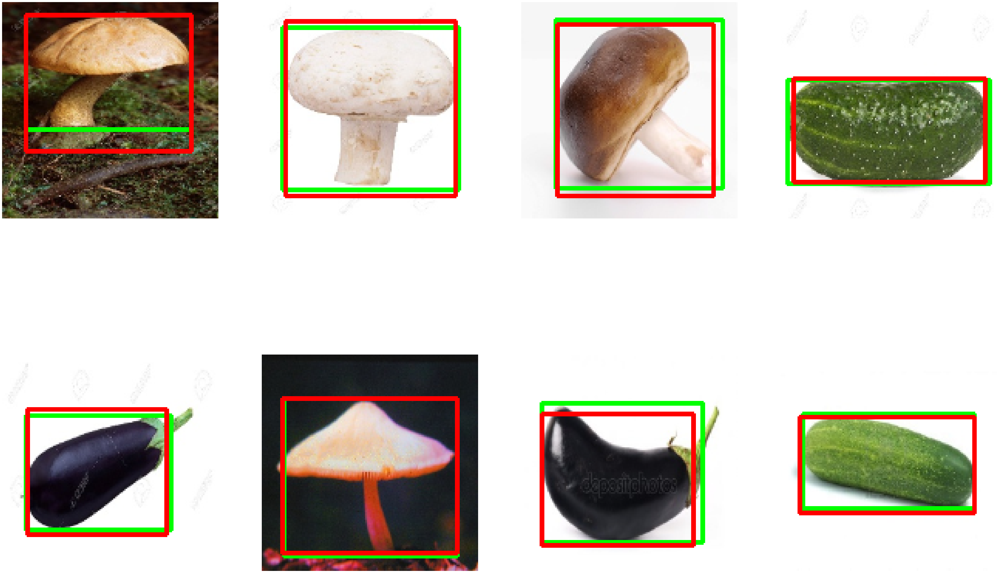

In [47]:
ims, gts, bbs = [], [], []
for i, batch in enumerate(validset):
  if i == 8:
    break
  with torch.no_grad():
    im, gt = batch
    im = im.unsqueeze(0).to(device)
    pred_bbox = model(im, gt.to(device))
    ims.append(im)
    gts.append(gt)
    bbs.append(pred_bbox[0])
plt.figure(figsize=(60,40))
vizualization(ims, gts, bbs)